Thu Jun  8 21:29:20 2017


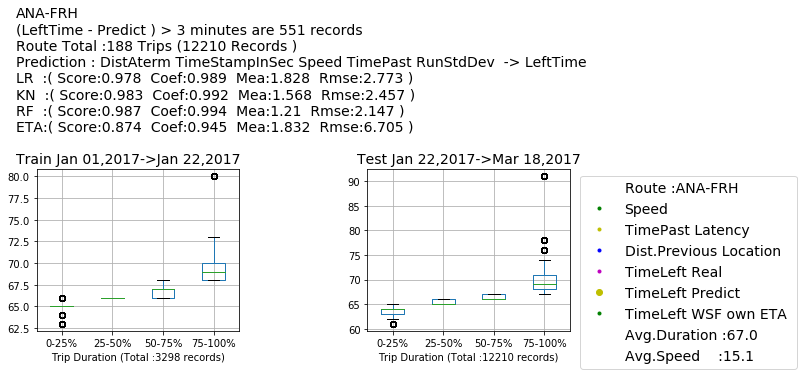

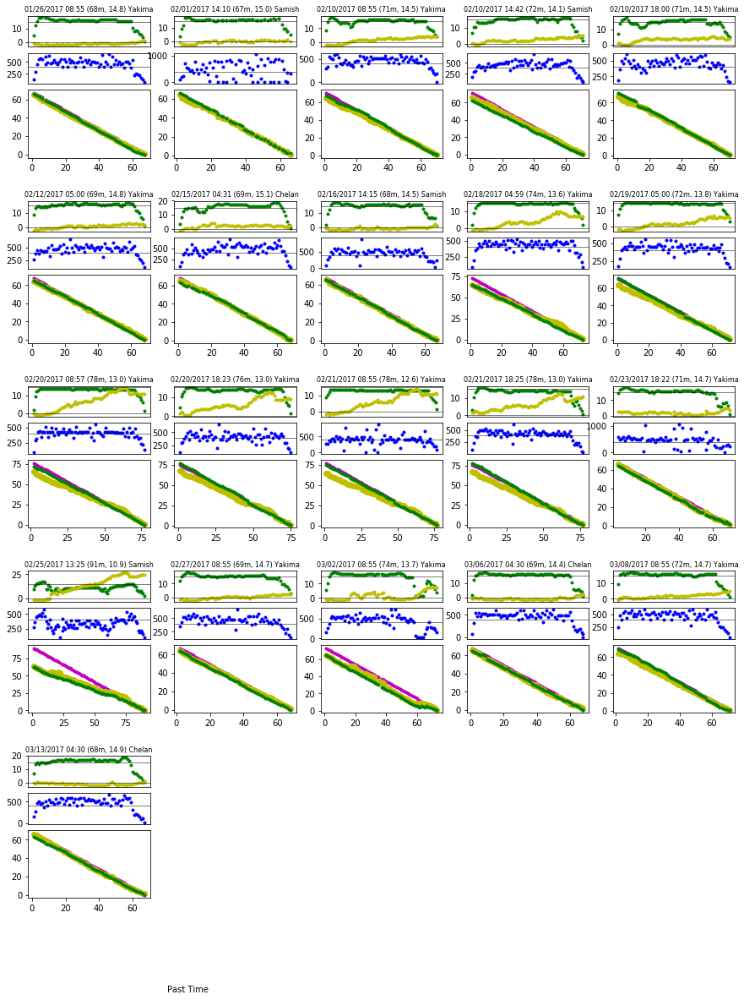

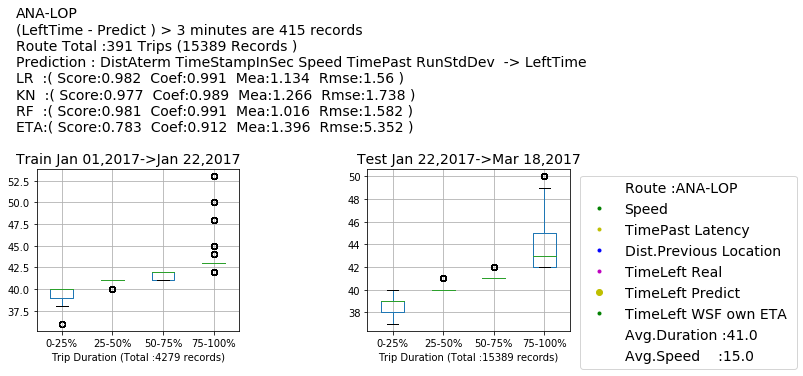

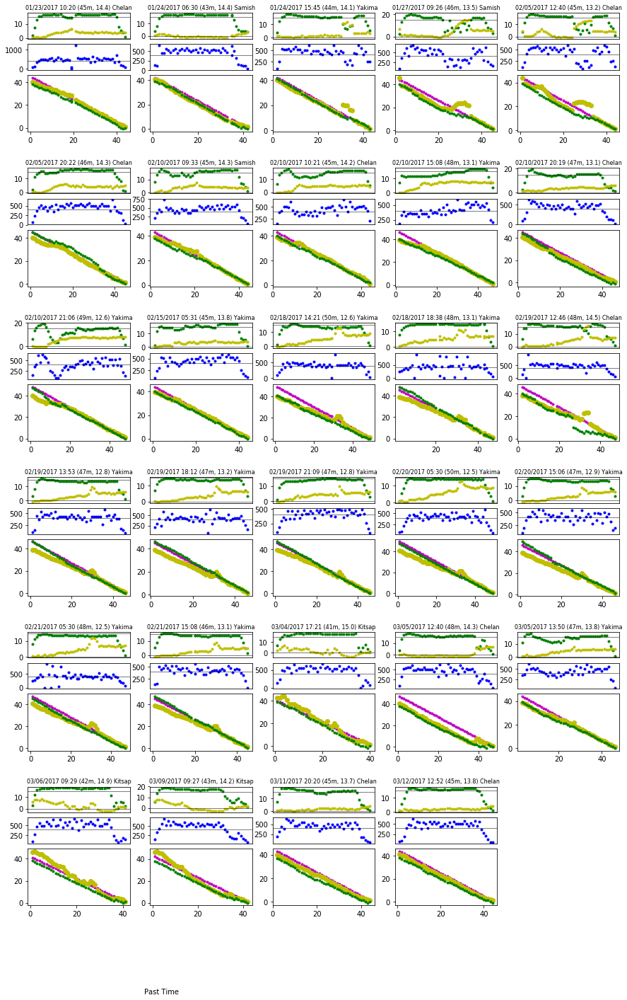

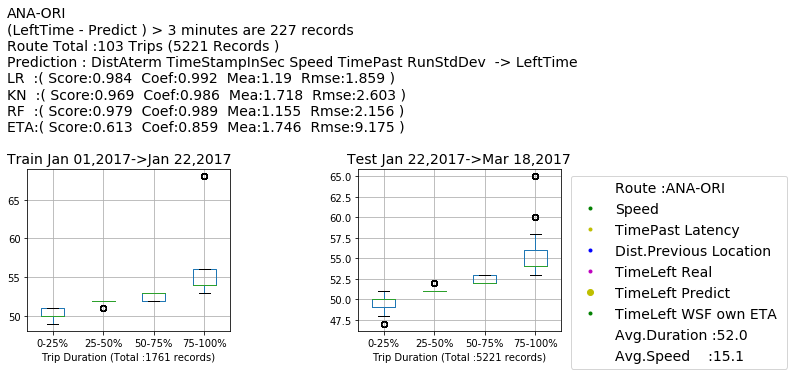

...

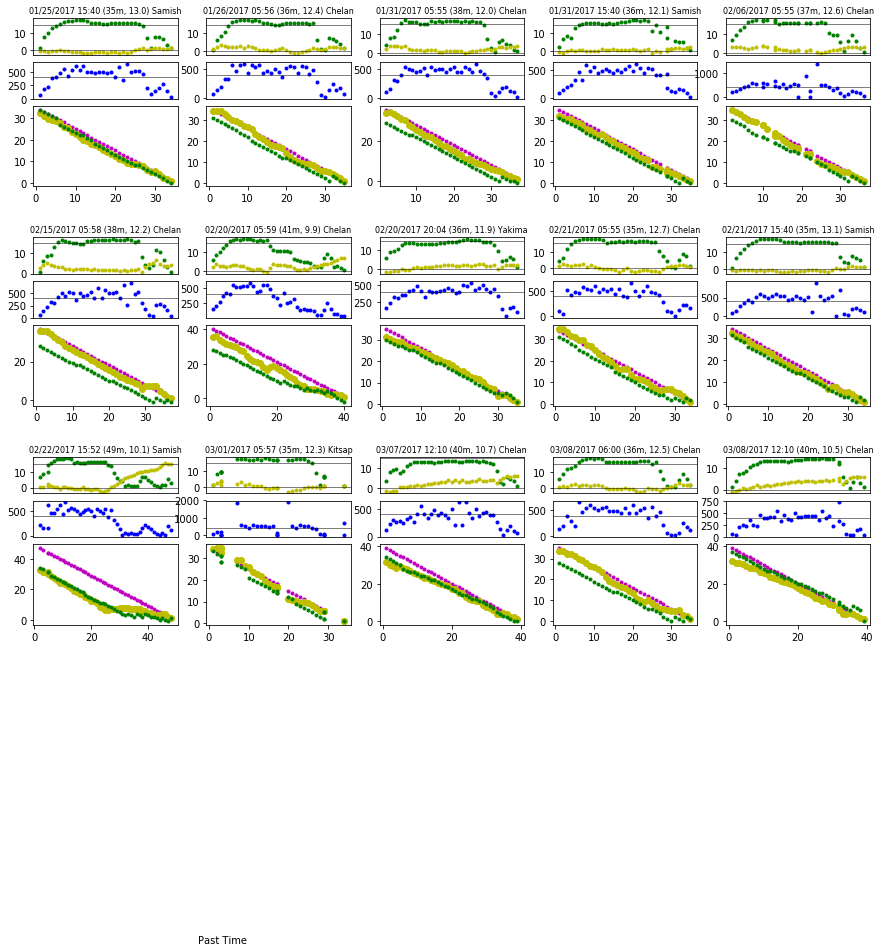

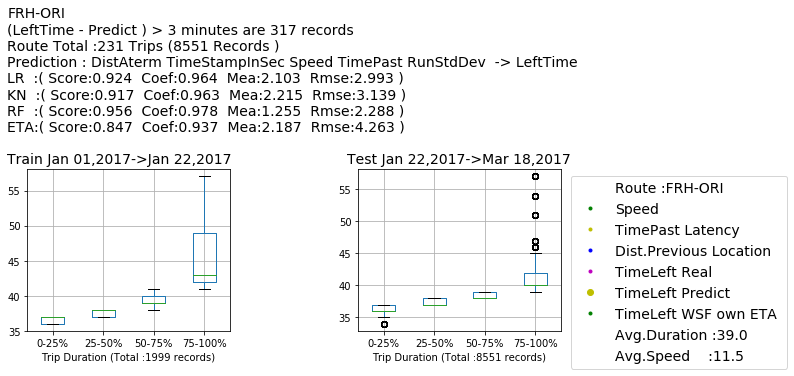

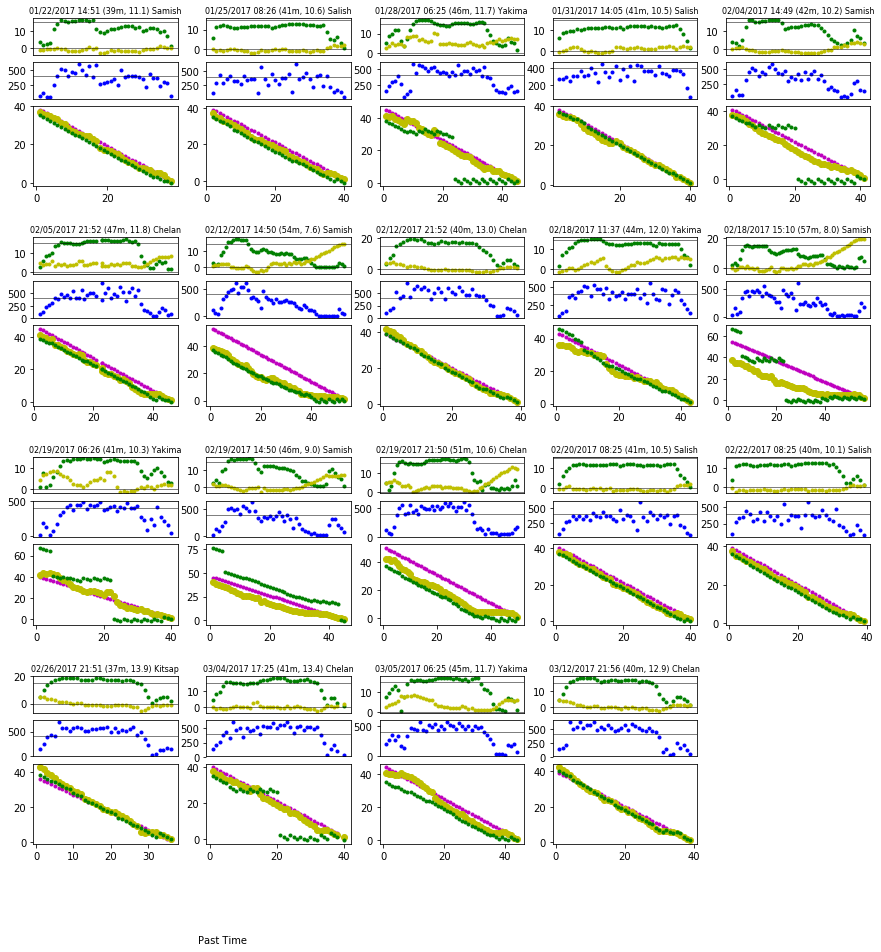

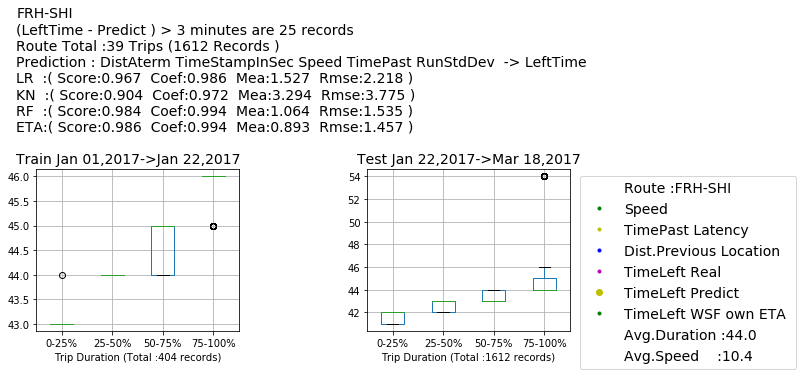

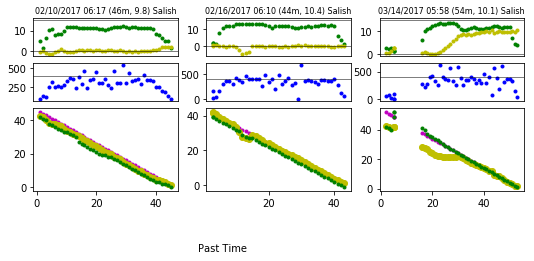

FRH - SID Route has no record, Trainin Data: 188 or Test Data: 0


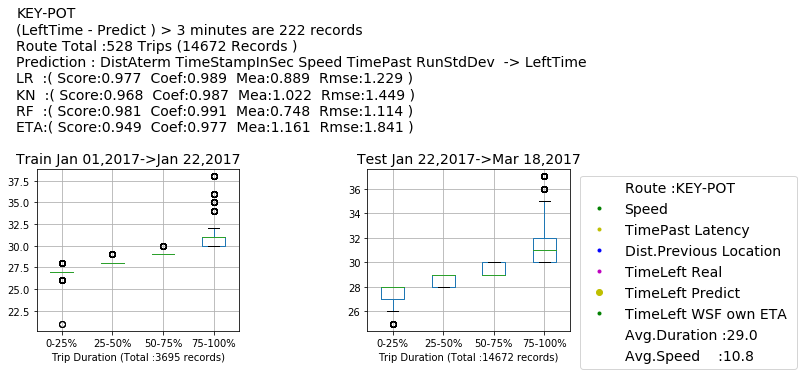

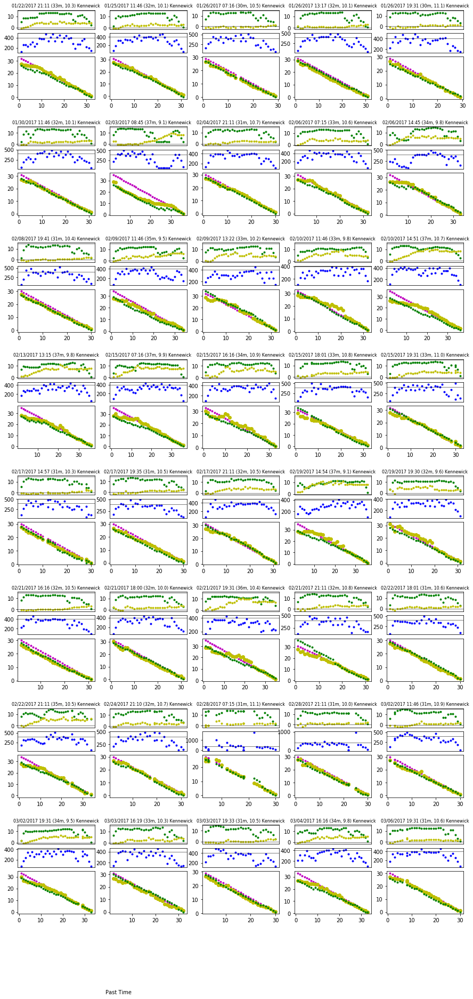

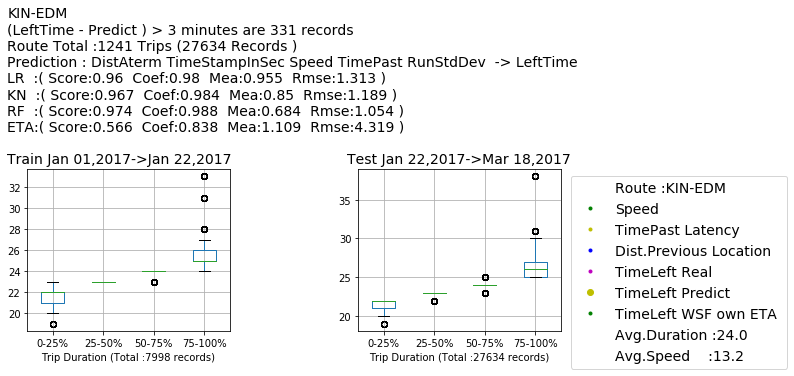

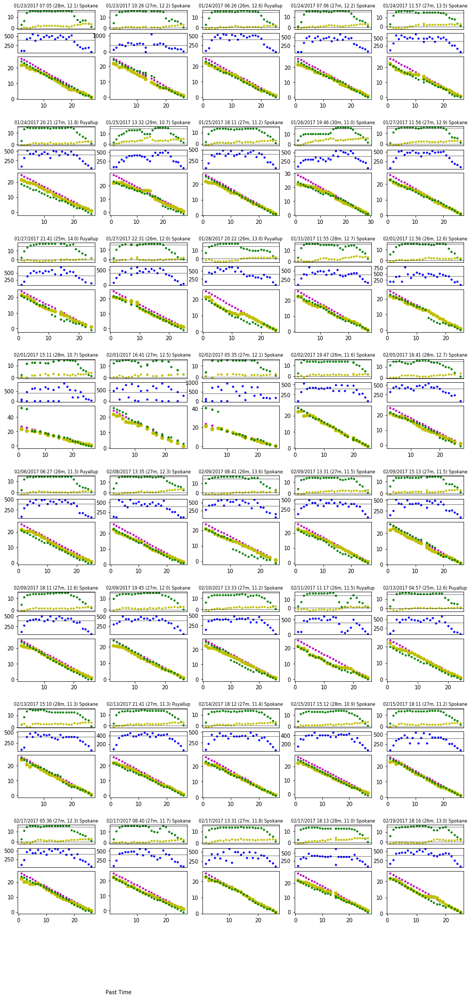

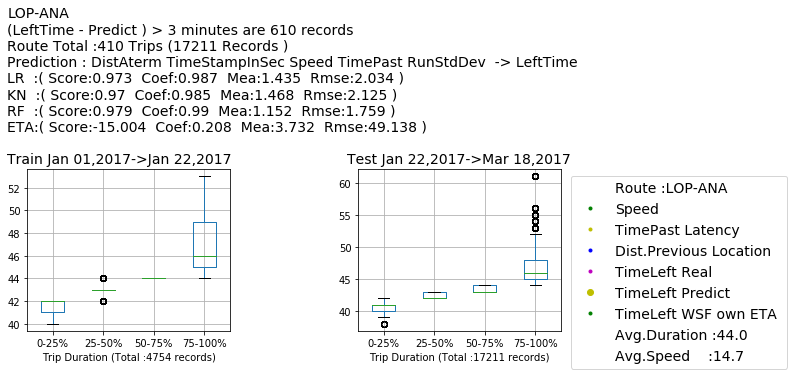

...

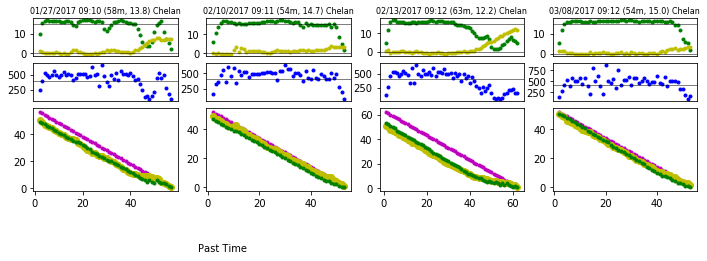

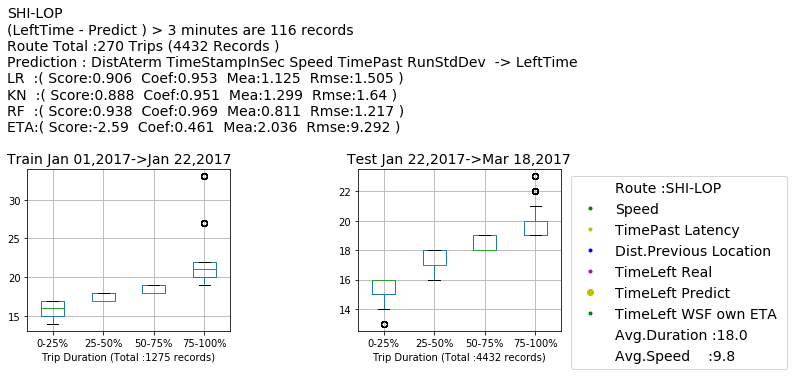

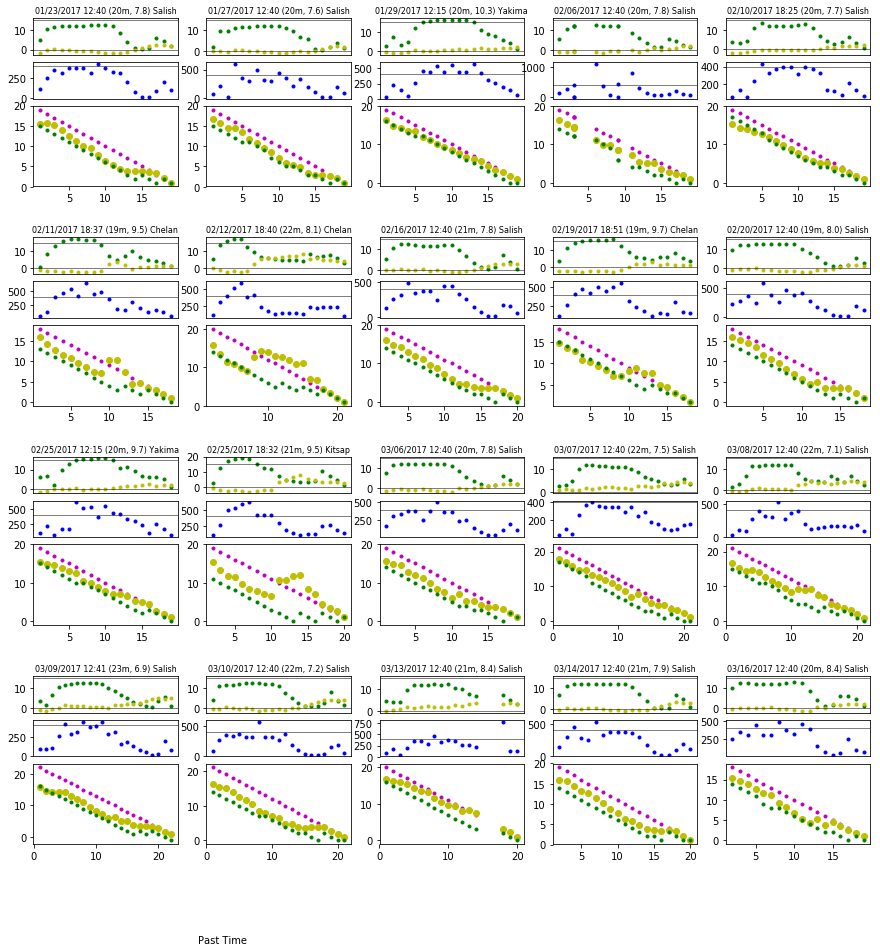

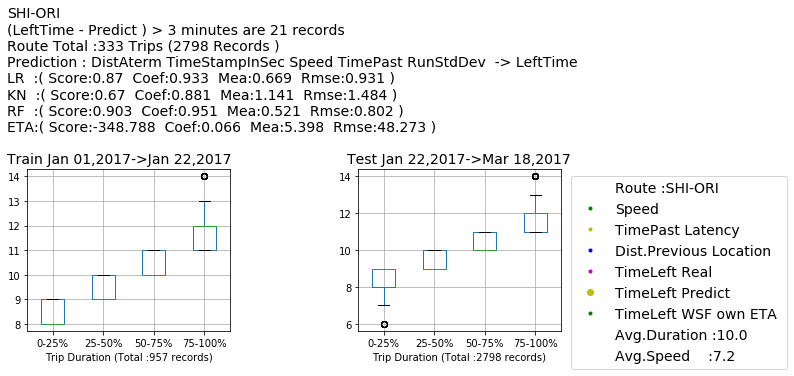

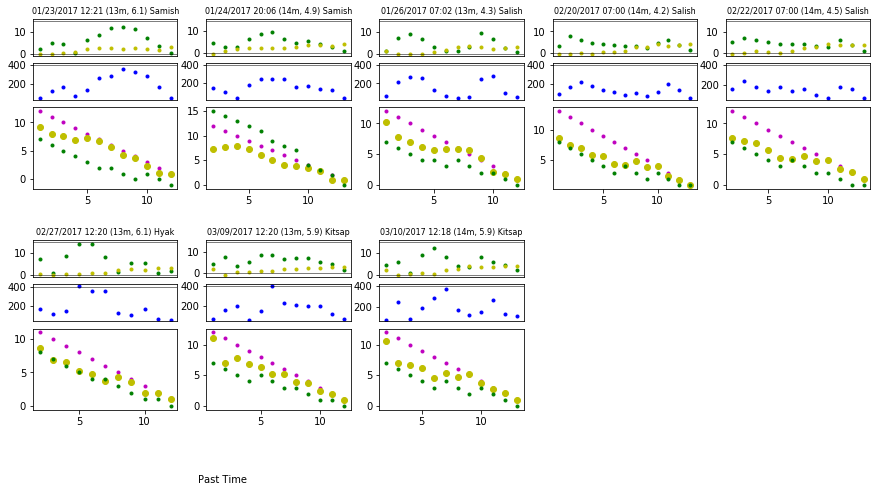

SID - FRH Route has no record, Trainin Data: 508 or Test Data: 0


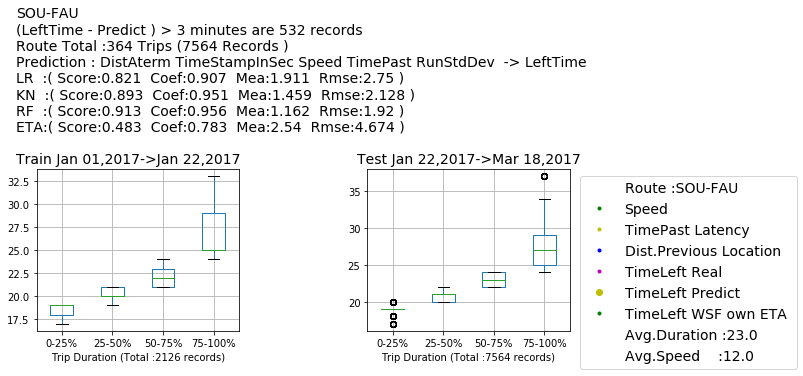

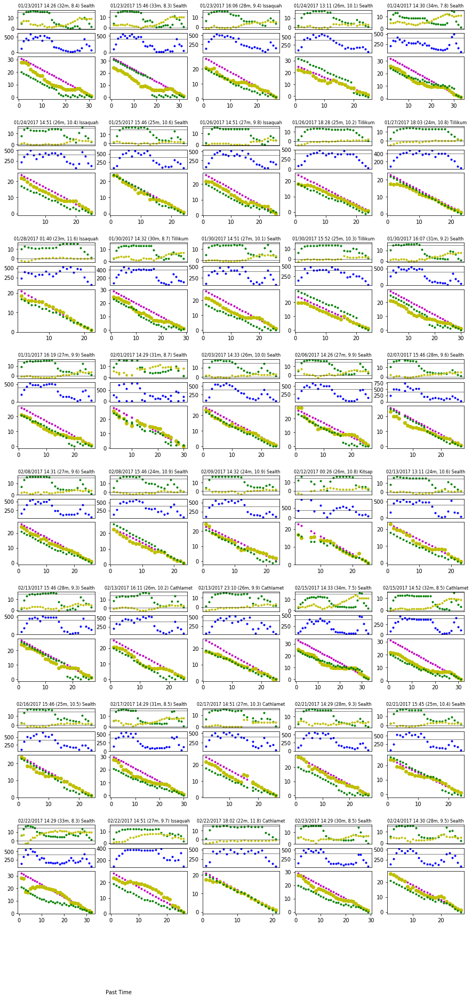

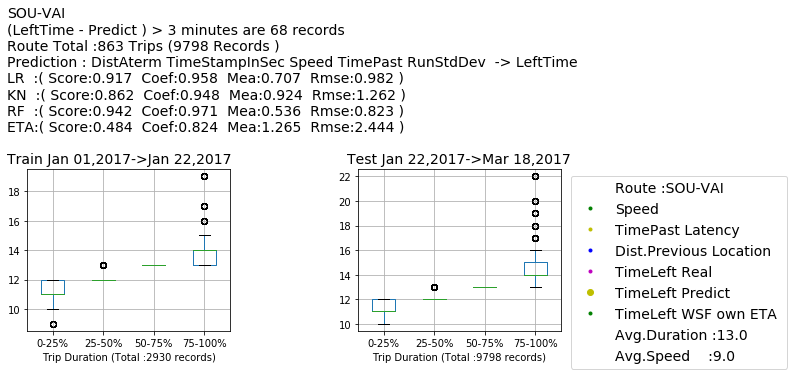

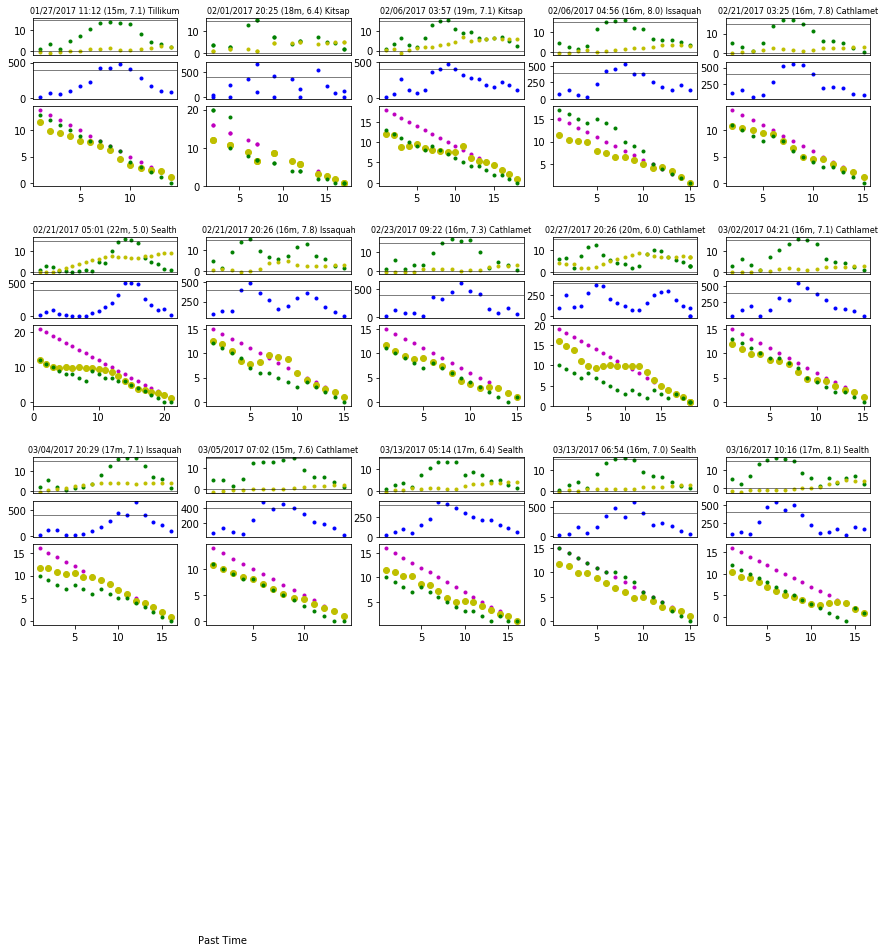

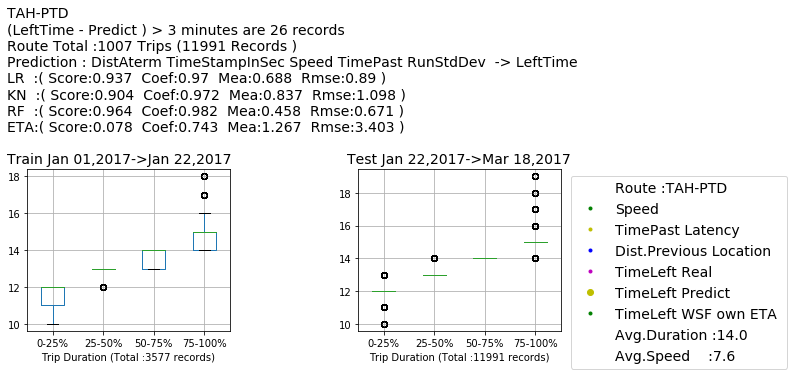

...

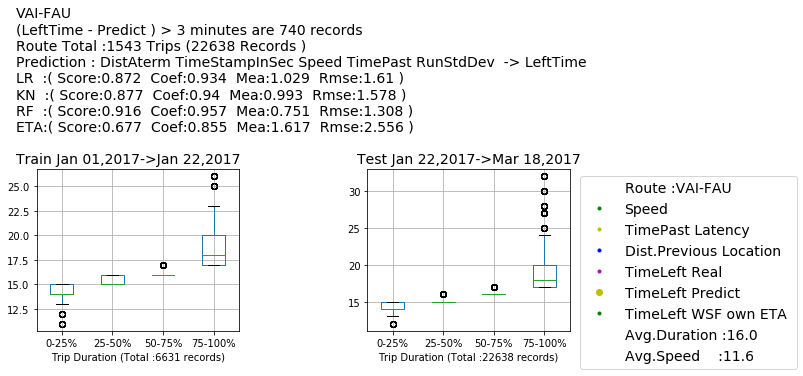

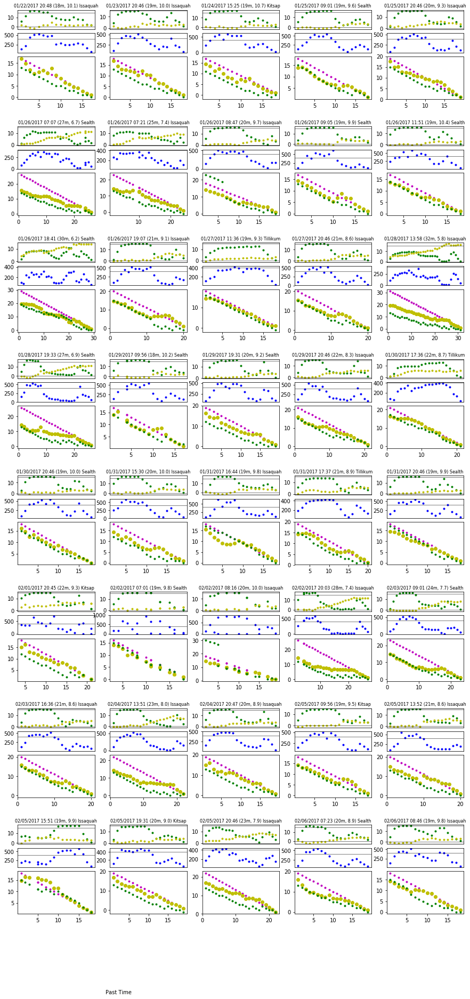

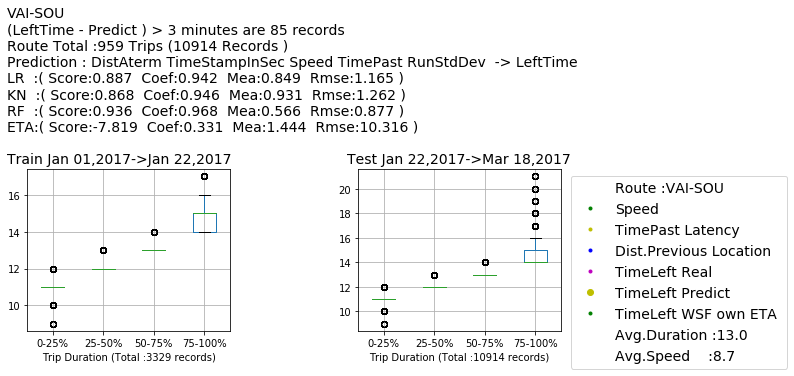

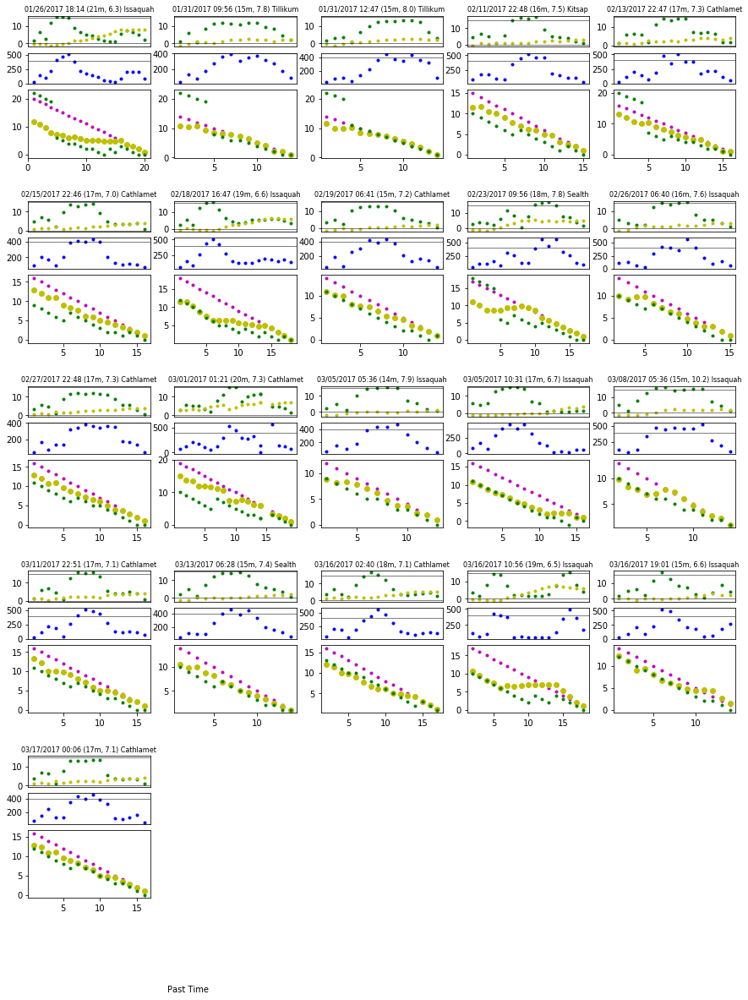

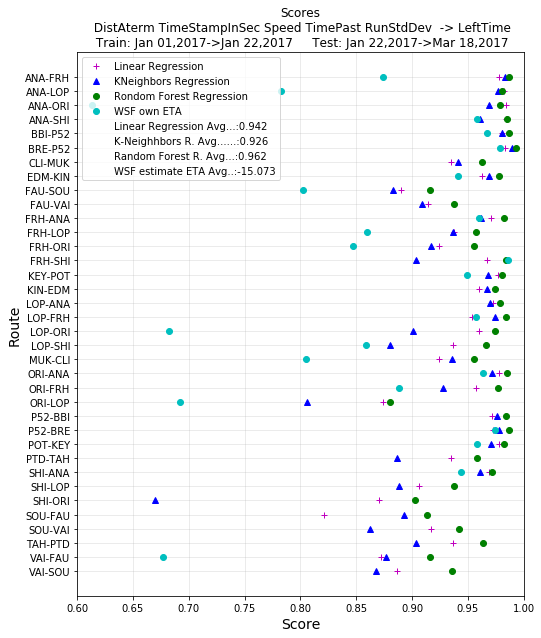

      Route  RFscore  RFevscore  RFcorrcoef  RFmae  RFrmse  RFmape  RFsmape  \
0   ANA-FRH    0.987      0.987       0.994  1.210   2.147   4.819    0.018   
1   ANA-LOP    0.981      0.982       0.991  1.016   1.582   6.335    0.025   
2   ANA-ORI    0.979      0.979       0.989  1.155   2.156   5.941    0.022   
3   ANA-SHI    0.985      0.985       0.992  0.969   1.738   5.232    0.020   
4   BBI-P52    0.987      0.987       0.994  0.681   1.029   5.363    0.021   
5   BRE-P52    0.993      0.993       0.997  0.884   1.312   4.071    0.016   
6   CLI-MUK    0.963      0.964       0.982  0.502   0.761   7.608    0.035   
7   EDM-KIN    0.978      0.978       0.989  0.667   0.982   6.529    0.028   
8   FAU-SOU    0.916      0.923       0.962  0.994   1.774   8.961    0.047   
9   FAU-VAI    0.938      0.939       0.969  0.603   1.067   7.805    0.039   
10  FRH-ANA    0.982      0.982       0.991  1.491   2.646   5.541    0.022   
11  FRH-LOP    0.957      0.958       0.979  1.223  

In [3]:
import time
import pandas as pd
import datetime as dt
import numpy as np
import sklearn  
import matplotlib.pyplot as plt
import matplotlib.ticker as ticker
from matplotlib.patches        import Rectangle
from sklearn.linear_model      import LinearRegression          
from sklearn.neighbors         import KNeighborsRegressor
from sklearn.ensemble          import RandomForestRegressor
from sklearn.metrics           import mean_absolute_error
from sklearn.metrics           import mean_squared_error
from sklearn.metrics           import explained_variance_score
from sklearn.metrics           import r2_score
from scipy.stats               import mode
from sklearn.feature_selection import SelectFromModel
from sklearn                   import preprocessing as pre


def readData(xCleanData):    
    xdf = pd.read_csv(xCleanData,header=0)
    xdf['n_leftdock']  = pd.to_datetime(xdf['n_leftdock'])
    xdf['n_arrive']    = pd.to_datetime(xdf['n_arrive']  )    
    return xdf

def readData_ForMultiFiles(xCleanData, yCleanData):    
    xdf               = pd.read_csv(xCleanData,header=0)
    ydf               = pd.read_csv(yCleanData,header=0)
    zdf = pd.concat([xdf, ydf], ignore_index=True)
    zdf['n_leftdock'] = pd.to_datetime(zdf['n_leftdock'])
    zdf['n_arrive']   = pd.to_datetime(zdf['n_arrive']  )    
    ############ Trip Count - Time Average and Latency
    zdf['TripAvg']    = zdf.groupby(['lastdock_abbrev', 'aterm_abbrev'])['n_time_trip'].transform('mean')
    zdf['Latency']    = zdf['n_time_trip'] - zdf['TripAvg']
    return zdf

def dockRouteInfo(df):
    df.sort_values( ['lastdock_abbrev','aterm_abbrev','n_leftdock'] , ascending=[1,1,1], inplace=True ) 
    xdf = pd.DataFrame({'TripTot' : df.groupby( ["lastdock_abbrev", "aterm_abbrev"])['n_leftdock'].nunique(),
                        'TripMin' : df.groupby( ["lastdock_abbrev", "aterm_abbrev"])['n_time_trip'].min(),
                        'TripMax' : df.groupby( ["lastdock_abbrev", "aterm_abbrev"])['n_time_trip'].max(),
                        'RecTot'  : df.groupby( ["lastdock_abbrev", "aterm_abbrev"]).size(),
                        'TripFD'  : df.groupby( ["lastdock_abbrev", "aterm_abbrev"])['n_leftdock'].first(),
                        'TripLD'  : df.groupby( ["lastdock_abbrev", "aterm_abbrev"])['n_leftdock'].last(),
                        'DistMin' : df.groupby( ["lastdock_abbrev", "aterm_abbrev"])['n_distTot'].min(),
                        'DistMax' : df.groupby( ["lastdock_abbrev", "aterm_abbrev"])['n_distTot'].max()
                       }).reset_index()
    xdf['Route'] = xdf[ 'lastdock_abbrev'] + '-' + xdf['aterm_abbrev'] 
    xdf          = xdf.reset_index()    
    xdf['index'] = xdf.index
    return xdf

def runRegression(xdf_r,xind,Mdf,xlastdock,xaterm,xTMPDir,xTrainF,xTrainL,xTestF,xTestL):
#     print(xlastdock, xaterm)
    Mdf = Mdf[(Mdf['lastdock_abbrev'] == xlastdock ) & (Mdf['aterm_abbrev']== xaterm ) ]
#     Mdf.to_csv(xTMPDir + 'tmp/' + xlastdock + xaterm+'.csv', mode='w', header=True, index=False)

    xTripAvg     = Mdf.iloc[0]['TripAvg'] 
    xSpeedAvg    = Mdf.iloc[0]['SpeedAvg'] 
    
    trdf  = Mdf.loc[ (Mdf['n_leftdock'] >= xTrainF) & (Mdf['n_leftdock'] <= xTrainL),
                      ['DistAterm','TimeStampInSec','speed','n_time_past', 'RunStdDev','etaTimeLeft','n_time_left',
                       'TripAvg','SpeedAvg','n_leftdock','n_time_trip','n_SpeedTripAvg','name','n_dist_prevloc'] ]

    tsdf  = Mdf.loc[ (Mdf['n_leftdock'] >= xTestF) & (Mdf['n_leftdock'] <= xTestL), 
                      ['DistAterm','TimeStampInSec','speed','n_time_past', 'RunStdDev','etaTimeLeft','n_time_left',
                       'TripAvg','SpeedAvg','n_leftdock','n_time_trip','n_SpeedTripAvg','name','n_dist_prevloc'] ]
    
    if (trdf.shape[0] > 0) & (tsdf.shape[0] > 0 ):
        x_model = [(LinearRegression(),
                                    'LR_predict','LRscore','LRcorrcoef','LRmae','LRrmse','LRevscore','LRmape','LRsmape','LRptime',''),
                   (KNeighborsRegressor(n_neighbors=200, weights='distance'),
                                    'KN_predict','KNscore','KNcorrcoef','KNmae','KNrmse','KNevscore','KNmape','KNsmape','KNptime',''),
                   (RandomForestRegressor(n_estimators=500,oob_score=True, max_features=None, n_jobs=-1 ), 
                                    'RF_predict','RFscore','RFcorrcoef','RFmae','RFrmse','RFevscore','RFmape','RFsmape','RFptime',''),
                   ('ETA'          ,''          ,'ETscore','ETcorrcoef','ETmae','ETrmse','ETevscore','ETmape','ETsmape','ETptime',''),
                   (RandomForestRegressor(n_estimators=500,oob_score=True, max_features=None, n_jobs=-1 ), 
                                    'RFI_predict','RFIscore','RFIcorrcoef','RFImae','RFIrmse','RFIevscore','RFImape','RFIsmape','RFIptime','RFIfeatImp') ]

        X_train = trdf[ ['DistAterm','TimeStampInSec','speed','n_time_past', 'RunStdDev'] ]
        X_test  = tsdf[ ['DistAterm','TimeStampInSec','speed','n_time_past', 'RunStdDev'] ]

        y_train = trdf['n_time_left']
        y_test  = tsdf['n_time_left']
        for ind, model in enumerate(x_model):
            t_start = time.time()
            
            if (ind == 3):
                y_p                              = tsdf['etaTimeLeft']
                xdf_r.loc[xind, x_model[ind][9]] = 0.0
            
            elif (ind == 4):
                clf = x_model[ind][0].fit(X_train, y_train)

                importances = pd.DataFrame({'feature':X_train.columns,'FeatureImportance':np.round(x_model[2][0].feature_importances_,3)})    #http://stackoverflow.com/questions/22361781/how-does-sklearn-random-forest-index-feature-importances
                importances = importances.sort_values('FeatureImportance',ascending=False).set_index('feature')
#                 importances.plot.bar( title=xlastdock + '-' + xaterm +'   Train Data: ' + xTrainF.strftime("%b %d,%Y") + '->'+ xTrainL.strftime("%b %d,%Y"), fontsize=20)
#                 plt.tight_layout()
#                 plt.savefig( '/Users/ekinezgi/Documents/FerryProject/tmp/'+xlastdock+'_'+xaterm+'_feature_importances_NEW_'+x_model[2][1]+'.png' )
                
                modelNEW = SelectFromModel(clf, threshold=0.01,  prefit=True) 

                feature_idx = modelNEW.get_support()
                feature_name = X_train.columns[feature_idx]
                FeatureName = ','.join( feature_name.tolist() )
#                 print('FeatureName', FeatureName)
                
                X_train = modelNEW.transform(X_train)
                X_test = modelNEW.transform(X_test)
                
                scaler = pre.StandardScaler().fit(X_train)
                X_train = scaler.transform(X_train)
                X_test  = scaler.transform(X_test)

                model[0].fit(X_train, y_train)
                y_p                              = model[0].predict(X_test) 
                xdf_r.loc[xind, x_model[ind][9]] = time.time() - t_start
                tsdf[ x_model[ind][1] ]          = y_p
                xdf_r.loc[xind,x_model[ind][10] ] = FeatureName

            else :
                model[0].fit(X_train, y_train)
                y_p                              = model[0].predict(X_test) 
                xdf_r.loc[xind, x_model[ind][9]] = time.time() - t_start
                tsdf[ x_model[ind][1] ]          = y_p

                
                
            s       = round( r2_score(y_test, y_p)                                 , 3)
            c       = round( np.corrcoef(y_test, y_p )[0,1]                        , 3)
            mae     = round( mean_absolute_error(y_test, y_p)                      , 3) 
            rmse    = round( np.sqrt( mean_squared_error(y_test, y_p) )            , 3)
            evscore = round( explained_variance_score(y_test, y_p)                 , 3)
            mape    = round( np.mean(np.abs((y_test - y_p) / y_test)) * 100        , 3) 
            smape   = round( np.sum( np.abs(y_test - y_p)) / np.sum(y_test + y_p)  , 3) 

            xdf_r.loc[xind, x_model[ind][2]] = s
            xdf_r.loc[xind, x_model[ind][3]] = c
            xdf_r.loc[xind, x_model[ind][4]] = mae
            xdf_r.loc[xind, x_model[ind][5]] = rmse
            xdf_r.loc[xind, x_model[ind][6]] = evscore
            xdf_r.loc[xind, x_model[ind][7]] = mape
            xdf_r.loc[xind, x_model[ind][8]] = smape
    else :   
        print('%s - %s Route has no record, Trainin Data: %i or Test Data: %i' %(xlastdock, xaterm,trdf.shape[0], tsdf.shape[0]) )
    return xdf_r, tsdf, trdf



def GenerateSubPlot(xdf_r,xind,tsdf,trdf,xlastdock,xaterm,xTrainF,xTrainL,xTestF,xTestL,xPredictInfo,xLngTripFile,xTMPDir,xSubPltNmb):
    ######## use RF_predict to calculate Latency for test df
    tsdf[ 'RF_latency' ] = tsdf['n_time_past'] + tsdf['RF_predict'] - tsdf['TripAvg']
    xdf_r.loc[xind, 'RecTrain']    = trdf.shape[0]
    xdf_r.loc[xind, 'RecTest']     = tsdf.shape[0]

    xErr = 3       # error x minutes will be plot
    xTripAvg     = trdf.iloc[0]['TripAvg'] 
    xSpeedAvg    = trdf.iloc[0]['SpeedAvg'] 

    grtsdf         = tsdf.groupby(['n_leftdock']).agg({ 'n_leftdock':{'Record':'count'},'n_time_trip':{'TripTime':'last'} })
    grtsdf.columns = grtsdf.columns.droplevel()    # drop a level from a multi-level column index
    grtsdf.reset_index(inplace=True)             # Turn Multi-index into column
    xRecT  = tsdf.shape[0]
    xTrpT  = grtsdf.shape[0]
    grtsdf = grtsdf[ grtsdf['TripTime'] > xTripAvg + 3]
    xLongT = grtsdf.shape[0]

    tsdf['Err']         = tsdf.apply(lambda row:  row['n_time_left'] - row['RF_predict']  ,axis=1)
    tsdf.sort_values(  ['n_leftdock'] , ascending=[1], inplace=True ) 
    ##### Check number of error records
    ydf = tsdf.loc[ tsdf.Err > xErr, ['n_leftdock','n_time_past','n_time_left','n_time_trip','RF_predict','n_Count']]

    ydf.sort_values(  ['n_leftdock'] , ascending=[1], inplace=True ) 

    gdf = ydf.groupby(['n_leftdock']).agg( {'n_leftdock' :{'Record':'count' }, 'n_time_trip':{'TripTime':'last'} })
    gdf.columns       = gdf.columns.droplevel()    # drop a level from a multi-level column index
    gdf.reset_index(inplace=True)          # Turn Multi-index into column
    gdf.sort_values( ['n_leftdock' ] , ascending=[1], inplace=True ) 

    trdf.sort_values( ['n_time_trip'] , ascending=[1], inplace=True ) 
    tsdf.sort_values( ['n_time_trip'] , ascending=[1], inplace=True ) 
    trdf['n_time_trip_bin'] = pd.qcut( trdf['n_time_trip'].rank(method='first'), 4, labels=['0-25%', '25-50%', '50-75%', '75-100%'])
    tsdf['n_time_trip_bin'] = pd.qcut( tsdf['n_time_trip'].rank(method='first'), 4, labels=['0-25%', '25-50%', '50-75%', '75-100%'])

    fig = plt.figure(figsize=(15, 3))
    plt.subplots_adjust(left=0.1, right=0.75, bottom=0.1, top=0.9) #,hspace = .15,wspace=.1)
    plt.subplot( 1, 8, (1,2) )
    ax = plt.gca()
    trdf.boxplot(column='n_time_trip', by='n_time_trip_bin', ax = ax)
    ax.set_xlabel('Trip Duration (Total :' + str(trdf.shape[0]) + ' records)' )
    
    plt.title( xlastdock +'-'+ xaterm +
            '\n(LeftTime - Predict ) > ' +str(xErr) +' minutes are '+str(ydf.shape[0])+' records' +
            '\nRoute Total :' + str(xTrpT) +' Trips (' + str(xRecT) + ' Records )' + 
            '\nPrediction : ' + xPredictInfo  +
            '\nLR  :( Score:'+str(xdf_r.iloc[xind]['LRscore'])+'  Coef:'+str(xdf_r.iloc[xind]['LRcorrcoef'])+'  Mea:'+str(xdf_r.iloc[xind]['LRmae'])+'  Rmse:'+str(xdf_r.iloc[xind]['LRrmse'])+' )'+ 
            '\nKN  :( Score:'+str(xdf_r.iloc[xind]['KNscore'])+'  Coef:'+str(xdf_r.iloc[xind]['KNcorrcoef'])+'  Mea:'+str(xdf_r.iloc[xind]['KNmae'])+'  Rmse:'+str(xdf_r.iloc[xind]['KNrmse'])+' )'+ 
            '\nRF  :( Score:'+str(xdf_r.iloc[xind]['RFscore'])+'  Coef:'+str(xdf_r.iloc[xind]['RFcorrcoef'])+'  Mea:'+str(xdf_r.iloc[xind]['RFmae'])+'  Rmse:'+str(xdf_r.iloc[xind]['RFrmse'])+' )'+  
            '\nETA:( Score:' +str(xdf_r.iloc[xind]['ETscore'])+'  Coef:'+str(xdf_r.iloc[xind]['ETcorrcoef'])+'  Mea:'+str(xdf_r.iloc[xind]['ETmae'])+'  Rmse:'+str(xdf_r.iloc[xind]['ETrmse'])+' )'+ 
            '\n '+
            '\nTrain ' + xTrainF.strftime("%b %d,%Y") + '->'+ xTrainL.strftime("%b %d,%Y"), 
            ha='left',fontsize=14, x=-0.1 )
    fig.suptitle('')

    plt.subplot( 1, 8,(4,5) )
    ax = plt.gca()
    tsdf.boxplot(column='n_time_trip', by='n_time_trip_bin', ax = ax)
    ax.set_xlabel('Trip Duration (Total :' + str(tsdf.shape[0])+ ' records)' )
    plt.title('Test ' + xTestF.strftime("%b %d,%Y") + '->' + xTestL.strftime("%b %d,%Y") ,
            fontsize=14)
    fig.suptitle('')

    Ldf = tsdf[ tsdf['n_time_trip'] > xTripAvg + 3 ]    # Long Duration Trips
    if (xlastdock=='ANA') & (xaterm=='FRH'): 
        Ldf.to_csv(xLngTripFile, mode='w', header=True, index=False)
    else:
        Ldf.to_csv(xLngTripFile, mode='a', header=False, index=False)

    if (ydf.shape[0] > 0):
        xSize = gdf.shape[0]
        if (xSize > xSubPltNmb): 
            xSize = xSubPltNmb
        GrpSize = int(round( .5 + xSize/5, 0))
        fig2 = plt.figure(figsize=(15, GrpSize*4))
        fig2.text(0.3 , 0.08, 'Past Time', ha='center', va='center', rotation='horizontal', fontsize=10)                    
        gdf.sort_values( ['n_leftdock' ] , ascending=[1], inplace=True ) 
        gdf.reset_index(inplace=True)
        title_color = 'black'   # 'red'
        count = 0
        nX   = 0
        for ind, val in gdf.head(xSize).iterrows():
            count += 1
            if (count > 5):
                count = 1
                nX  += 1
            xdf = tsdf[ tsdf.n_leftdock == val['n_leftdock']]

            plt.subplot( 5*GrpSize,5,int( ind+1 + 4*(5*nX) ))
            plt.title(val['n_leftdock'].strftime("%m/%d/%Y %H:%M") + 
                    ' ('+ xdf['n_time_trip'].iloc[0].astype(str)+ 'm, ' + round(xdf['n_SpeedTripAvg'].iloc[0],1).astype(str) + ') '+ xdf['name'].iloc[0] ,
                    color=title_color, fontsize=8, y=.97)
            L1, = plt.plot(xdf['n_time_past'], xdf['speed']           , 'g.' )
            L2, = plt.plot(xdf['n_time_past'], xdf['RF_latency']      , 'y.' )
            plt.axhline(y=0 , color='black', linestyle='-', linewidth=0.5)
            plt.axhline(y=15, color='black', linestyle='-', linewidth=0.5)
            plt.gca().xaxis.set_major_locator(plt.NullLocator())

            plt.subplot( 5*GrpSize,5,int( ind+6 + 4*(5*nX) ))
            L3, = plt.plot(xdf['n_time_past'], xdf['n_dist_prevloc']    , 'b.' )
            plt.axhline(y=400, color='black', linestyle='-', linewidth=0.5)
            plt.gca().xaxis.set_major_locator(plt.NullLocator())

            plt.subplot( 5*GrpSize,5,( int( ind+11 + 4*(5*nX)), int( ind+16 + 4*(5*nX)) ) )
            L4, = plt.plot(xdf['n_time_past'], xdf['n_time_left']      , 'm.' )
            L5, = plt.plot(xdf['n_time_past'], xdf['RF_predict']       , 'yo' )
            L6, = plt.plot(xdf['n_time_past'], xdf['etaTimeLeft']      , 'g.' )
        extra = Rectangle((0, 0), 1, 1, fc="w", fill=False, edgecolor='none', linewidth=0)
        ax.legend([ extra, L1, L2, L3, L4, L5, L6, extra, extra, extra],
            ['Route :'+ xlastdock +'-'+ xaterm,
             'Speed',
             'TimePast Latency ',
             'Dist.Previous Location',
             'TimeLeft Real ', 
             'TimeLeft Predict ', 
             'TimeLeft WSF own ETA ', 
             'Avg.Duration :'        + str(round(xTripAvg,1))   , 
             'Avg.Speed    :'        + str(round(xSpeedAvg,1)) ], 
            bbox_to_anchor = (1.05, 0.96), ncol=1, fontsize=14, borderaxespad=0.)
    plt.show()                
    return xdf_r, tsdf

def GenerateScorePlot(df, xTrainF, xTrainL, xTestF, xTestL, xTMPFile, xPredictInfo):
    df           = df[ df.RFscore!=0 ] 
    df           = df[ df.LRscore.notnull() | df.KNscore.notnull() | df.RFscore.notnull()  ] 
    df           = df.reset_index()    
    df.sort_values( ['lastdock_abbrev','aterm_abbrev'] , ascending=[1,1], inplace=True ) 
    df['index']  = df.shape[0] - df.index
    
    fig          = plt.figure(figsize=(8,10))
    plt.title('Scores' + 
              '\n ' + xPredictInfo  +
              '\n Train: '  + xTrainF.strftime("%b %d,%Y") + '->'+ xTrainL.strftime("%b %d,%Y") + 
              '     Test: ' +  xTestF.strftime("%b %d,%Y") + '->' + xTestL.strftime("%b %d,%Y") , 
              fontsize=12)
    plt.xlabel('Score', fontsize=14)
    plt.ylabel('Route', fontsize=14)
    ax = plt.gca()
    ax.set_xlim([0.6,1])

    my_yticks = df['Route'] 
    y         = df['index']
    plt.yticks(y, my_yticks )
    x1        = df['LRscore'] 
    plt.plot(x1, y,'m+', label='Linear Regression')
    x2        = df['KNscore']
    plt.plot(x2, y,'b^', label='KNeighbors Regression')
    x3        = df['RFscore']
    plt.plot(x3, y,'go', label='Rondom Forest Regression')
    x4        = df['ETscore']
    plt.plot(x4, y,'co', label='WSF own ETA')
    
    
    plt.axvline(x=np.average(x1), color='g', linestyle='',  linewidth=0.5, label='Linear Regression Avg...:'  + str(round(np.average(x1),3)) )
    plt.axvline(x=np.average(x2), color='g', linestyle='',  linewidth=0.5, label='K-Neighhbors R. Avg......:' + str(round(np.average(x2),3)) )
    plt.axvline(x=np.average(x3), color='g', linestyle='',  linewidth=0.5, label='Random Forest R. Avg...:'   + str(round(np.average(x3),3)) )
    plt.axvline(x=np.average(x4), color='g', linestyle='',  linewidth=0.5, label='WSF estimate ETA Avg..:'    + str(round(np.average(x4),3)) )

    plt.legend(loc='best', prop={'size':10})    
    plt.grid( which='minor', alpha=0.1 )
    plt.grid( which='major', alpha=0.3 )

    t = time.strftime("%Y%m%d_%H%M%S_", time.localtime(start))
    df.to_csv(  xTMPFile+'Plot/'+ t +'*'+xPredictInfo+'*'+ '_ALL_ROUTE.csv', mode='w', header=True, index=False)
    fig.savefig(xTMPFile+'Plot/'+ t +'*'+xPredictInfo+'*'+ '_Score'        , dpi=300, bbox_inches='tight')
    plt.show()
    return df
    

def run():
    vPredictInfo = 'DistAterm TimeStampInSec Speed TimePast RunStdDev  -> LeftTime'
    vTrainF = pd.to_datetime('2017-01-01')
    vTrainL = pd.to_datetime('2017-01-22')
    vTestF  = pd.to_datetime('2017-01-22')
    vTestL  = pd.to_datetime('2017-03-18')
    vTMPDir      = '/Users/ekinezgi/Documents/FerryProject/'
    vLngTripFile = '/Users/ekinezgi/Documents/FerryProject/tmp/2017JanMar_LngTrip.csv'
    vCleanData   = '/Users/ekinezgi/Documents/FerryProject/2017JanMar_Data.csv'
    vSubPltNmb   = 40  ## Number of subplot will generate
    
    
#     df_v = readData_ForMultiFiles(vCleanData,vCleanData_2)
    df_v = readData(vCleanData)
    df_r = dockRouteInfo(df_v)
    df_r.sort_values( ['Route'] , ascending=[1], inplace=True ) 

    for ind, row in df_r.iterrows():
        val = row['Route']
        df_r, tsdf, trdf = runRegression(df_r,ind,df_v,val[:3],val[-3:],vTMPDir,vTrainF,vTrainL,vTestF,vTestL)
        if (trdf.shape[0] > 0) & (tsdf.shape[0] > 0): 
            df_r,tsdf       = GenerateSubPlot(   df_r,ind, tsdf,trdf,val[:3]  ,val[-3:],vTrainF,vTrainL,vTestF,vTestL,vPredictInfo,vLngTripFile,vTMPDir,vSubPltNmb)
        tsdf.to_csv(vTMPDir +'tmp/' + val[:3] + val[-3:] +'_test.csv', mode='w', header=True, index=False)
    df_r = GenerateScorePlot(df_r, vTrainF, vTrainL, vTestF, vTestL, vTMPDir, vPredictInfo)
    print( df_r[['Route', 'RFscore', 'RFevscore', 'RFcorrcoef', 'RFmae', 'RFrmse', 'RFmape', 'RFsmape','LRscore','LRmae','LRmape']] )

if __name__ == '__main__':
    plt.close('all')
    print(time.ctime())
    start = time.time()
    run()
    end = time.time()
    tot_time = end - start
    print('Total time used :', tot_time)     